# <b>Assignment : DT</b>

<font color='red'><b> Please check below video before attempting this assignment</b></font>

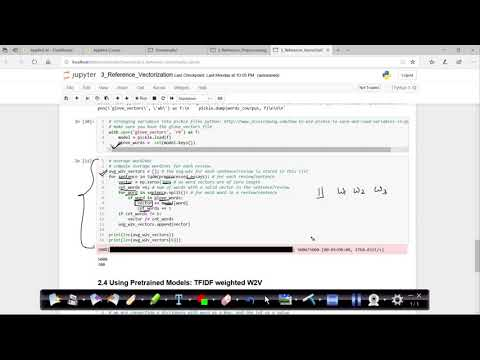

In [ ]:
from IPython.display import YouTubeVideo
YouTubeVideo('ZhLXULFjIjQ', width="1000",height="500")

<font color='red'><b> TF-IDFW2V</b></font>

<b>Tfidf w2v (w1,w2..) = (tfidf(w1) * w2v(w1) + tfidf(w2) * w2v(w2) + …)  /    (tfidf(w1) + tfidf(w2) + …)</b>

<b>(Optional) Please check course video on [AVgw2V and TF-IDFW2V ](https://www.appliedaicourse.com/lecture/11/applied-machine-learning-online-course/2916/avg-word2vec-tf-idf-weighted-word2vec/3/module-3-foundations-of-natural-language-processing-and-machine-learning)for more details.

<font color='blue'><b>Glove vectors </b></font>

<b>In this assignment you will be working with glove vectors , please check  [this](https://en.wikipedia.org/wiki/GloVe_(machine_learning)) and [this](https://en.wikipedia.org/wiki/GloVe_(machine_learning)) for more details.</b><br>

Download glove vectors from this [link ](https://drive.google.com/file/d/1lDca_ge-GYO0iQ6_XDLWePQFMdAA2b8f/view?usp=sharing)

In [ ]:
# mounting th google drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#please use below code to load glove vectors 
import pickle
with open('/content/drive/MyDrive/AAIC_datasets/DT_donors_choose/glove_vectors', 'rb') as f:
    model = pickle.load(f)
    glove_words =  set(model.keys())

# <font color='red'> <b>Task - 1</b></font>

<ol>
    <li><strong>Apply Decision Tree Classifier(DecisionTreeClassifier) on these feature sets</strong>
        <ul>
            <li><font color='red'>Set 1</font>: categorical, numerical features +  preprocessed_essay (TFIDF) + Sentiment scores(preprocessed_essay)</li>
            <li><font color='red'>Set 2</font>: categorical, numerical features +  preprocessed_essay (TFIDF W2V) + Sentiment scores(preprocessed_essay)</li>        </ul>
    </li>
    <li><strong>The hyper paramter tuning (best `depth` in range [1, 5, 10, 50], and the best `min_samples_split` in range [5, 10, 100, 500])</strong>
        <ul>
    <li>Find the best hyper parameter which will give the maximum <a href='https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/receiver-operating-characteristic-curve-roc-curve-and-auc-1/'>AUC</a> value</li>
    <li>find the best hyper paramter using k-fold cross validation(use gridsearch cv or randomsearch cv)/simple cross validation data(you can write your own for loops refer sample solution)</li>
        </ul>
    </li>
    <li>
    <strong>Representation of results</strong>
        <ul>
    <li>You need to plot the performance of model both on train data and cross validation data for each hyper parameter, like shown in the figure
    <img src='https://i.imgur.com/Gp2DQmh.jpg' width=500px> with X-axis as <strong>min_sample_split</strong>, Y-axis as <strong>max_depth</strong>, and Z-axis as <strong>AUC Score</strong> , we have given the notebook which explains how to plot this 3d plot, you can find it in the same drive <i>3d_scatter_plot.ipynb</i></li>
            <p style="text-align:center;font-size:30px;color:red;"><strong>or</strong></p> <br>
    <li>You need to plot the performance of model both on train data and cross validation data for each hyper parameter, like shown in the figure
    <img src='https://i.imgur.com/fgN9aUP.jpg' width=300px> <a href='https://seaborn.pydata.org/generated/seaborn.heatmap.html'>seaborn heat maps</a> with rows as <strong>min_sample_split</strong>, columns as <strong>max_depth</strong>, and values inside the cell representing <strong>AUC Score</strong> </li>
    <li>You choose either of the plotting techniques out of 3d plot or heat map</li>
    <li>Once after you found the best hyper parameter, you need to train your model with it, and find the AUC on test data and plot the ROC curve on both train and test.
    <img src='https://i.imgur.com/wMQDTFe.jpg' width=300px></li>
    <li>Along with plotting ROC curve, you need to print the <a href='https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/confusion-matrix-tpr-fpr-fnr-tnr-1/'>confusion matrix</a> with predicted and original labels of test data points
    <img src='https://i.imgur.com/IdN5Ctv.png' width=300px></li>
    <li>Once after you plot the confusion matrix with the test data, get all the `false positive data points`
        <ul>
            <li> Plot the WordCloud(https://www.geeksforgeeks.org/generating-word-cloud-python/) with the words of essay text of these `false positive data points`</li>
            <li> Plot the box plot with the `price` of these `false positive data points`</li>
            <li> Plot the pdf with the `teacher_number_of_previously_posted_projects` of these `false positive data points`</li>
        </ul>
        </ul>
    </li>
   

In [ ]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

import pandas as pd
import numpy as np
import nltk
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc

import re
# Tutorial about Python regular expressions: https://pymotw.com/2/re/

import pickle
from tqdm import tqdm
import os
from collections import Counter

## DT On Set1

In [ ]:
import pandas
data = pandas.read_csv('/content/drive/MyDrive/AAIC_datasets/DT_donors_choose/preprocessed_data.csv')
data = data.head(80000)

In [ ]:
y = data['project_is_approved'].values
X = data.drop(['project_is_approved'], axis=1)
X.head(1)

,school_state,teacher_prefix,project_grade_category,teacher_number_of_previously_posted_projects,clean_categories,clean_subcategories,essay,price
0,ca,mrs,grades_prek_2,53,math_science,appliedsciences health_lifescience,i fortunate enough use fairy tale stem kits cl...,725.05


In [ ]:
# train test split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, stratify=y,random_state=42)

In [ ]:
print(X_train.shape)
print(X_test.shape)

(53600, 8)
(26400, 8)


In [ ]:
# doing TF-IDF vectorization on essay
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer(min_df=10,ngram_range=(1,4),max_features=5000)
vectorizer.fit(X_train['essay'].values)
X_train_essay_tfidf = vectorizer.transform(X_train['essay'].values)
X_test_essay_tfidf = vectorizer.transform(X_test['essay'].values)

In [ ]:
# one hot encoding on school_state
vectorizer = CountVectorizer()
vectorizer.fit(X_train['school_state'].values) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
X_train_state_ohe = vectorizer.transform(X_train['school_state'].values)
X_test_state_ohe = vectorizer.transform(X_test['school_state'].values)

In [ ]:
# one hot encoding on tecaher_prefix
vectorizer = CountVectorizer()
vectorizer.fit(X_train['teacher_prefix'].values) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
X_train_teacher_ohe = vectorizer.transform(X_train['teacher_prefix'].values)
X_test_teacher_ohe = vectorizer.transform(X_test['teacher_prefix'].values)


In [ ]:
# one hot encoding on project_grade _category
vectorizer = CountVectorizer()
vectorizer.fit(X_train['project_grade_category'].values) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
X_train_grade_ohe = vectorizer.transform(X_train['project_grade_category'].values)
X_test_grade_ohe = vectorizer.transform(X_test['project_grade_category'].values)


In [ ]:
# one hot encoding on clean_categories
vectorizer = CountVectorizer()
vectorizer.fit(X_train['clean_categories'].values) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
X_train_category_ohe = vectorizer.transform(X_train['clean_categories'].values)
X_test_category_ohe = vectorizer.transform(X_test['clean_categories'].values)


In [ ]:
# one hot encoding on clean_subcategories
vectorizer = CountVectorizer()
vectorizer.fit(X_train['clean_subcategories'].values) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
X_train_sub_category_ohe = vectorizer.transform(X_train['clean_subcategories'].values)
X_test_sub_category_ohe = vectorizer.transform(X_test['clean_subcategories'].values)


In [ ]:
# normalize price column
from sklearn.preprocessing import Normalizer
vectorizer = Normalizer()
vectorizer.fit(X_train['price'].values.reshape(1,-1)) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
X_train_price_std = vectorizer.transform(X_train['price'].values.reshape(1,-1))
X_test_price_std = vectorizer.transform(X_test['price'].values.reshape(1,-1))

X_train_price_std = X_train_price_std.reshape(-1,1)
X_test_price_std = X_test_price_std.reshape(-1,1)


In [ ]:
# normalize teacher_number_of_previously_posted_projects
vectorizer = Normalizer()
vectorizer.fit(X_train['teacher_number_of_previously_posted_projects'].values.reshape(1,-1)) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
X_train_teacher_std = vectorizer.transform(X_train['teacher_number_of_previously_posted_projects'].values.reshape(1,-1))
X_test_teacher_std = vectorizer.transform(X_test['teacher_number_of_previously_posted_projects'].values.reshape(1,-1))

X_train_teacher_std = X_train_teacher_std.reshape(-1,1)
X_test_teacher_std = X_test_teacher_std.reshape(-1,1)

In [ ]:
print(X_test_teacher_std.shape)

(26400, 1)


<font color='blue'><b>Hint for calculating Sentiment scores</b></font>

In [ ]:
import nltk
nltk.download('vader_lexicon')

[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


True

In [ ]:
import nltk
from nltk.sentiment.vader import SentimentIntensityAnalyzer

# import nltk
# nltk.download('vader_lexicon')

sid = SentimentIntensityAnalyzer()

def sentiment_scores(preprocessed_essays):
    sid = SentimentIntensityAnalyzer()
    neutral = []
    negative = []
    positive = []
    compound = []
    for sentiment in tqdm(preprocessed_essays):
        ss = sid.polarity_scores(sentiment)
        neutral.append(ss['neu'])
        negative.append(ss['neg'])
        positive.append(ss['pos'])
        compound.append(ss['compound'])
    neutral = np.array(neutral).reshape(-1,1)
    negative = np.array(negative).reshape(-1,1)
    positive = np.array(positive).reshape(-1,1)
    compound = np.array(compound).reshape(-1,1)
    return neutral, negative, positive, compound

# we can use these 4 things as features/attributes (neg, neu, pos, compound)
# neg: 0.0, neu: 0.753, pos: 0.247, compound: 0.93

In [ ]:
X_train_neutral, X_train_negative, X_train_positive, X_train_compound = sentiment_scores(X_train['essay'].values)
X_test_neutral, X_test_negative, X_test_positive, X_test_compound = sentiment_scores(X_test['essay'].values)

100%|██████████| 26400/26400 [00:47<00:00, 558.26it/s]


In [ ]:
print(X_test_neutral.shape)

(26400, 1)


In [ ]:
# preparing the final encoded dataframe
from scipy.sparse import hstack
X_tr = hstack((X_train_essay_tfidf, X_train_state_ohe, X_train_teacher_ohe, X_train_grade_ohe,X_train_category_ohe,X_train_sub_category_ohe, X_train_price_std, X_train_teacher_std, X_train_neutral, X_train_negative, X_train_positive, X_train_compound)).tocsr()
X_te = hstack((X_test_essay_tfidf, X_test_state_ohe, X_test_teacher_ohe, X_test_grade_ohe,X_test_category_ohe,X_test_sub_category_ohe, X_test_price_std, X_test_teacher_std,X_test_neutral, X_test_negative, X_test_positive, X_test_compound)).tocsr()

In [ ]:
# Hyper parameter Tuning
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier
dt_model = DecisionTreeClassifier()
param_grid = {"max_depth":[1,5,10,50],"min_samples_split":[5,10,100,500]}
clf = GridSearchCV(dt_model , param_grid, cv=3, scoring='roc_auc',return_train_score=True,n_jobs=-1,verbose=10)
clf.fit(X_tr, y_train)

Fitting 3 folds for each of 16 candidates, totalling 48 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    2.8s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    4.1s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    8.0s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:   15.0s
[Parallel(n_jobs=-1)]: Done  21 tasks      | elapsed:   37.6s
[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done  37 tasks      | elapsed:  3.4min
[Parallel(n_jobs=-1)]: Done  48 out of  48 | elapsed:  9.2min finished


GridSearchCV(cv=3, error_score=nan,
             estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort='deprecated',
                                              random_state=None,
                                              splitter='best'),
             iid='deprecated', n_jobs=-1,
             param_grid={'max_depth': [1, 5, 10, 50],
                         '

In [ ]:
clf.best_params_

{'max_depth': 10, 'min_samples_split': 500}

In [ ]:

results = pd.DataFrame.from_dict(clf.cv_results_)
train_auc= results['mean_train_score']
cv_auc = results['mean_test_score']
depth = results['param_max_depth']
min_samples_split = results['param_min_samples_split']

In [ ]:
results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,mean_train_score,std_train_score
0,1.306080,0.078043,0.032665,0.001313,1,5,"{'max_depth': 1, 'min_samples_split': 5}",0.549002,0.546536,0.558310,0.551283,0.005070,11,0.550174,0.551082,0.569064,0.556773,0.008699
1,1.183337,0.006417,0.034673,0.000877,1,10,"{'max_depth': 1, 'min_samples_split': 10}",0.549002,0.546536,0.558310,0.551283,0.005070,11,0.550174,0.551082,0.569064,0.556773,0.008699
2,1.182093,0.006303,0.035549,0.002861,1,100,"{'max_depth': 1, 'min_samples_split': 100}",0.549002,0.546536,0.558310,0.551283,0.005070,11,0.550174,0.551082,0.569064,0.556773,0.008699
3,1.173800,0.012021,0.034646,0.001033,1,500,"{'max_depth': 1, 'min_samples_split': 500}",0.549002,0.546536,0.558310,0.551283,0.005070,11,0.550174,0.551082,0.569064,0.556773,0.008699
4,5.562200,0.047867,0.037230,0.000884,5,5,"{'max_depth': 5, 'min_samples_split': 5}",0.620032,0.617759,0.615103,0.617632,0.002014,8,0.639388,0.650319,0.644786,0.644831,0.004463
5,5.557763,0.042025,0.035736,0.002593,5,10,"{'max_depth': 5, 'min_samples_split': 10}",0.620211,0.617776,0.615202,0.617730,0.002045,7,0.639289,0.650106,0.644786,0.644727,0.004416
6,5.531976,0.056255,0.037385,0.001440,5,100,"{'max_depth': 5, 'min_samples_split': 100}",0.620063,0.618158,0.614974,0.617732,0.002099,6,0.639133,0.650024,0.644556,0.644571,0.004447
7,5.495264,0.024598,0.032690,0.000437,5,500,"{'max_depth': 5, 'min_samples_split': 500}",0.623285,0.618158,0.615244,0.618896,0.003324,5,0.638854,0.650024,0.643332,0.644070,0.004590
8,14.121555,0.160575,0.035832,0.002467,10,5,"{'max_depth': 10, 'min_samples_split': 5}",0.633002,0.617944,0.613289,0.621412,0.008413,4,0.709757,0.710765,0.703204,0.707909,0.003352
9,13.916149,0.195560,0.035691,0.001466,10,10,"{'max_depth': 10, 'min_samples_split': 10}",0.635976,0.618214,0.611947,0.622046,0.010177,3,0.708066,0.709285,0.701329,0.706227,0.003499


In [ ]:
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()
import numpy as np
from IPython.display import HTML

In [ ]:
y1 = depth.values
x1 = min_samples_split.values
z1 = train_auc.values

y2 = depth.values
x2 = min_samples_split.values
z2 = cv_auc.values

# https://plot.ly/python/3d-axes/
trace1 = go.Scatter3d(x=x1,y=y1,z=z1, name = 'train')
trace2 = go.Scatter3d(x=x2,y=y2,z=z2, name = 'Cross validation')
data = [trace1, trace2]

layout = go.Layout(scene = dict(
        xaxis = dict(title='min_samples_split'),
        yaxis = dict(title='max_depth'),
        zaxis = dict(title='AUC'),))

fig = go.Figure(data=data, layout=layout)
HTML(fig.to_html())

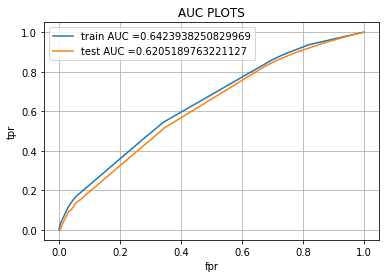

In [ ]:
from sklearn.metrics import roc_curve, auc
dt = DecisionTreeClassifier(max_depth=5, min_samples_split=500,class_weight='balanced')
dt.fit(X_tr, y_train)
y_train_proba = dt.predict_proba(X_tr)[:,1]
y_test_proba = dt.predict_proba(X_te)[:,1]

train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_proba)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_proba)
# plot train auc and test auc curve
plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("fpr")
plt.ylabel("tpr")
plt.title("AUC PLOTS")
plt.grid()
plt.show()

In [ ]:
# we are writing our own function for predict, with defined thresould
# we will pick a threshold that will give the least fpr
def find_best_threshold(threshould, fpr, tpr):
    t = threshould[np.argmax(tpr*(1-fpr))]
    # (tpr*(1-fpr)) will be maximum if your fpr is very low and tpr is very high
    print("the maximum value of tpr*(1-fpr)", max(tpr*(1-fpr)), "for threshold", np.round(t,3))
    return t

def predict_with_best_t(proba, threshould):
    predictions = []
    for i in proba:
        if i>=threshould:
            predictions.append(1)
        else:
            predictions.append(0)
    return np.array(predictions)

In [ ]:
# create confusion matrix
from sklearn.metrics import confusion_matrix
best_t = find_best_threshold(tr_thresholds, train_fpr, train_tpr)
train_matrix = confusion_matrix(y_train, predict_with_best_t(y_train_proba, best_t))
test_matrix = confusion_matrix(y_test, predict_with_best_t(y_test_proba, best_t))

the maximum value of tpr*(1-fpr) 0.3583060850483226 for threshold 0.553


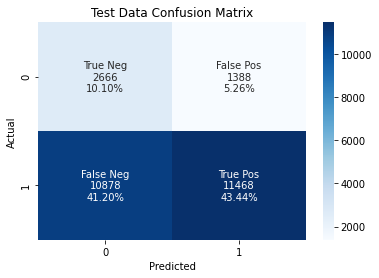

In [ ]:
# confusion matrix
group_names = ['True Neg','False Pos','False Neg','True Pos']
group_counts = ['{0:0.0f}'.format(value) for value in
                test_matrix.flatten()]
group_percentages = ['{0:.2%}'.format(value) for value in
                     test_matrix.flatten()/np.sum(test_matrix)]
labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]
labels = np.asarray(labels).reshape(2,2)
sns.heatmap(test_matrix, annot=labels, fmt='', cmap='Blues')
plt.title("Test Data Confusion Matrix")
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

In [ ]:
# finding out all false positives
y_pred = predict_with_best_t(y_test_proba, best_t)
false_positives = X_test[(y_test == 0) & (y_pred == 1)]

In [ ]:
false_positives.shape

(1388, 8)

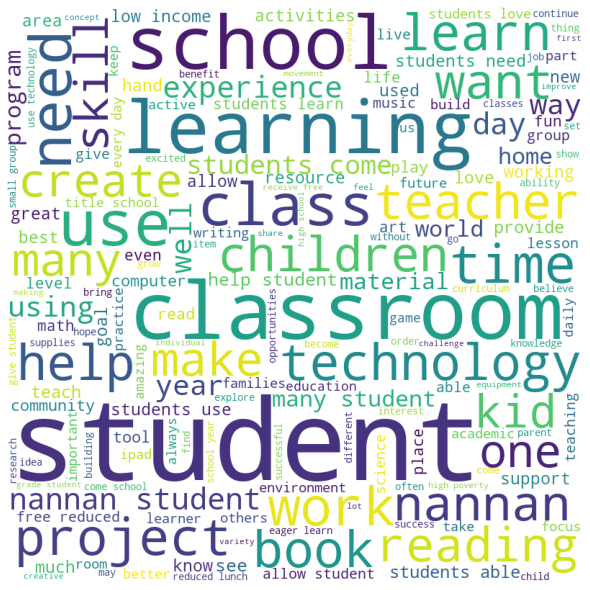

In [ ]:
# wordcloud for false positive essays
from wordcloud import WordCloud, STOPWORDS 
import matplotlib.pyplot as plt 
import pandas as pd 
  
# Reads 'Youtube04-Eminem.csv' file  
essays = false_positives['essay'] 
  
comment_words = '' 
stopwords = set(STOPWORDS) 
  
# iterate through the csv file 
for val in essays: 
      
    # typecaste each val to string 
    val = str(val) 
  
    # split the value 
    tokens = val.split() 
      
    # Converts each token into lowercase 
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 
      
    comment_words += " ".join(tokens)+" "
  
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                stopwords = stopwords, 
                min_font_size = 10).generate(comment_words) 
  
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

* The chances of acceptance is more when they mention words like student,classroom,technology,learning,skill

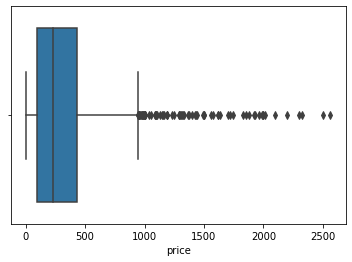

In [ ]:
sns.boxplot(false_positives['price'])

* 75 percentile of projects require less 500 normalized price

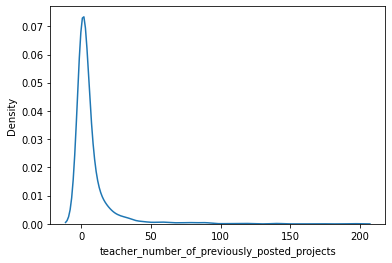

In [ ]:
sns.kdeplot(false_positives['teacher_number_of_previously_posted_projects'])

* Most of the projects submitted are by new teachers

In [ ]:
from prettytable import PrettyTable
summary = PrettyTable()
summary.field_names = ["Vectorizer", "Model", "max_depth","min_samples_split","AUC"]
summary.add_row(["TFIDF","Decision Tree",10, 500, 0.6205])

## DT On set2

In [ ]:
# S = ["abc def pqr", "def def def abc", "pqr pqr def"]
tfidf_model = TfidfVectorizer(min_df=10,ngram_range=(1,4),max_features=5000)
tfidf_model.fit(X_train['essay'].values)
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(tfidf_model.get_feature_names(), list(tfidf_model.idf_)))
tfidf_words = set(tfidf_model.get_feature_names())

In [ ]:
# average Word2Vec
# compute average word2vec for each review.
tfidf_w2v_vectors_train = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(X_train['essay'].values): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    tfidf_w2v_vectors_train.append(vector)
tfidf_w2v_vectors_train = np.array(tfidf_w2v_vectors_train)

100%|██████████| 53600/53600 [01:41<00:00, 527.66it/s]


In [ ]:
# average Word2Vec
# compute average word2vec for each review.
tfidf_w2v_vectors_test = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in tqdm(X_test['essay'].values): # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    tfidf_w2v_vectors_test.append(vector)
tfidf_w2v_vectors_test = np.array(tfidf_w2v_vectors_test)

100%|██████████| 26400/26400 [00:50<00:00, 526.92it/s]


In [ ]:
# preparing the final encoded dataframe
from scipy.sparse import hstack
X_tr = hstack((tfidf_w2v_vectors_train, X_train_state_ohe, X_train_teacher_ohe, X_train_grade_ohe,X_train_category_ohe,X_train_sub_category_ohe, X_train_price_std, X_train_teacher_std, X_train_neutral, X_train_negative, X_train_positive, X_train_compound)).tocsr()
X_te = hstack((tfidf_w2v_vectors_test, X_test_state_ohe, X_test_teacher_ohe, X_test_grade_ohe,X_test_category_ohe,X_test_sub_category_ohe, X_test_price_std, X_test_teacher_std,X_test_neutral, X_test_negative, X_test_positive, X_test_compound)).tocsr()

In [ ]:
#Hyperparameter Tuning
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV
from sklearn.tree import DecisionTreeClassifier
dt_model = DecisionTreeClassifier()
param_grid = {"max_depth":[1,5,10,50],"min_samples_split":[5,10,100,500]}
clf = GridSearchCV(dt_model , param_grid, cv=3, scoring='roc_auc',return_train_score=True,n_jobs=-1,verbose=20)
clf.fit(X_tr, y_train)

Fitting 3 folds for each of 16 candidates, totalling 48 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    4.0s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    4.2s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    6.9s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    7.1s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    9.9s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:   10.0s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:   12.8s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:   13.0s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:   15.7s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:   15.9s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:   18.7s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:   18.8s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:   32.4s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:   32.6s
[Parallel(n_jobs=-1)]: Done  15 tasks      | elapsed:   

GridSearchCV(cv=3, error_score=nan,
             estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort='deprecated',
                                              random_state=None,
                                              splitter='best'),
             iid='deprecated', n_jobs=-1,
             param_grid={'max_depth': [1, 5, 10, 50],
                         '

In [ ]:
clf.best_params_

{'max_depth': 5, 'min_samples_split': 5}

In [ ]:
# obtaining the results from gridsearch
results = pd.DataFrame.from_dict(clf.cv_results_)
train_auc= results['mean_train_score']
cv_auc = results['mean_test_score']
depth = results['param_max_depth']
min_samples_split = results['param_min_samples_split']

In [ ]:
#3d plot for AUC vs max_depth vs min_samples_split
y1 = depth.values
x1 = min_samples_split.values
z1 = train_auc.values

y2 = depth.values
x2 = min_samples_split.values
z2 = cv_auc.values

# https://plot.ly/python/3d-axes/
trace1 = go.Scatter3d(x=x1,y=y1,z=z1, name = 'train')
trace2 = go.Scatter3d(x=x2,y=y2,z=z2, name = 'Cross validation')
data = [trace1, trace2]

layout = go.Layout(scene = dict(
        xaxis = dict(title='min_samples_split'),
        yaxis = dict(title='max_depth'),
        zaxis = dict(title='AUC'),))

fig = go.Figure(data=data, layout=layout)
HTML(fig.to_html())

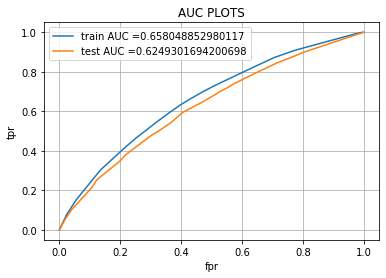

In [ ]:
# calculate the AUC on test data
from sklearn.metrics import roc_curve, auc
dt = DecisionTreeClassifier(max_depth=5,min_samples_split=5)
dt.fit(X_tr, y_train)
y_train_proba = dt.predict_proba(X_tr)[:,1]
y_test_proba = dt.predict_proba(X_te)[:,1]

train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_proba)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_proba)
# plot train auc and test auc curve
plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("fpr")
plt.ylabel("tpr")
plt.title("AUC PLOTS")
plt.grid()
plt.show()

In [ ]:
# create confusion matrix
from sklearn.metrics import confusion_matrix
best_t = find_best_threshold(tr_thresholds, train_fpr, train_tpr)
train_matrix = confusion_matrix(y_train, predict_with_best_t(y_train_proba, best_t))
test_matrix = confusion_matrix(y_test, predict_with_best_t(y_test_proba, best_t))

the maximum value of tpr*(1-fpr) 0.3808418631893395 for threshold 0.857


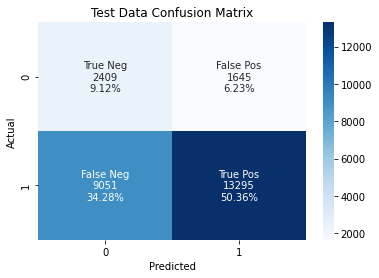

In [ ]:
#confusion matrix
group_names = ['True Neg','False Pos','False Neg','True Pos']
group_counts = ['{0:0.0f}'.format(value) for value in
                test_matrix.flatten()]
group_percentages = ['{0:.2%}'.format(value) for value in
                     test_matrix.flatten()/np.sum(test_matrix)]
labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]
labels = np.asarray(labels).reshape(2,2)
sns.heatmap(test_matrix, annot=labels, fmt='', cmap='Blues')
plt.title("Test Data Confusion Matrix")
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

In [ ]:
#false positive data
y_pred = predict_with_best_t(y_test_proba, best_t)
false_positives = X_test[(y_test == 0) & (y_pred == 1)]

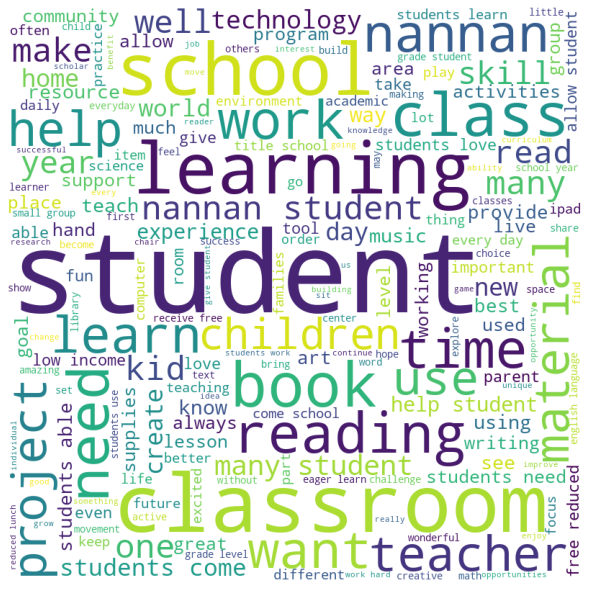

In [ ]:
from wordcloud import WordCloud, STOPWORDS 
import matplotlib.pyplot as plt 
import pandas as pd 
  
# Reads 'Youtube04-Eminem.csv' file  
essays = false_positives['essay'] 
  
comment_words = '' 
stopwords = set(STOPWORDS) 
  
# iterate through the csv file 
for val in essays: 
      
    # typecaste each val to string 
    val = str(val) 
  
    # split the value 
    tokens = val.split() 
      
    # Converts each token into lowercase 
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 
      
    comment_words += " ".join(tokens)+" "
  
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                stopwords = stopwords, 
                min_font_size = 10).generate(comment_words) 
  
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

* The chances of acceptance is more when they mention words like student,classroom,reading,school

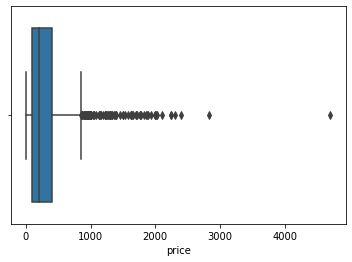

In [ ]:
sns.boxplot(false_positives['price'])

* Lot many high budget projects are also supported

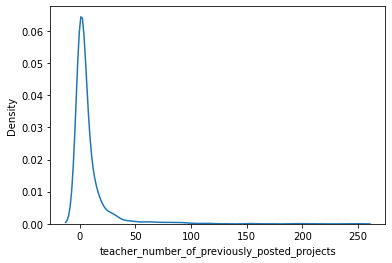

In [ ]:
sns.kdeplot(false_positives['teacher_number_of_previously_posted_projects'])

* Most of the projects are submitted by new teachers(teachers with previuos 0,1 or 2 projects)

In [ ]:
summary.add_row(["TFIDF_W2V","Decision Tree",5, 5, 0.625])

# <font color='red'><b> Task - 2 </b></font>

For this task consider **set-1** features.

*  Select all the features which are having non-zero feature importance.You can get the feature importance using  'feature_importances_` 
   (https://scikit-learn.org/stable/modules/generated/sklearn.tree.DecisionTreeClassifier.html), discard the all other remaining features and then apply any of the model of you choice i.e. (Dession tree, Logistic Regression, Linear SVM).
*  You need to do hyperparameter tuning corresponding to the model you selected and procedure in step 2 and step 3<br>
  **Note**: when you want to find the feature importance make sure you don't use max_depth parameter keep it None.
  </li>
    <br>
You need to summarize the results at the end of the notebook, summarize it in the table format
        <img src='http://i.imgur.com/YVpIGGE.jpg' width=400px>
    </li>
</ol>

In [ ]:
# doing TF-IDF vectorization on essay
from sklearn.feature_extraction.text import TfidfVectorizer
vectorizer = TfidfVectorizer(min_df=10,ngram_range=(1,4),max_features=5000)
vectorizer.fit(X_train['essay'].values)
X_train_essay_tfidf = vectorizer.transform(X_train['essay'].values)
X_test_essay_tfidf = vectorizer.transform(X_test['essay'].values)

In [ ]:
# preparing the final encoded dataframe
from scipy.sparse import hstack
X_tr = hstack((X_train_essay_tfidf, X_train_state_ohe, X_train_teacher_ohe, X_train_grade_ohe,X_train_category_ohe,X_train_sub_category_ohe, X_train_price_std, X_train_teacher_std, X_train_neutral, X_train_negative, X_train_positive, X_train_compound)).tocsr()
X_te = hstack((X_test_essay_tfidf, X_test_state_ohe, X_test_teacher_ohe, X_test_grade_ohe,X_test_category_ohe,X_test_sub_category_ohe, X_test_price_std, X_test_teacher_std,X_test_neutral, X_test_negative, X_test_positive, X_test_compound)).tocsr()

In [ ]:
dt_model = DecisionTreeClassifier()
dt_model.fit(X_tr,y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

In [ ]:
# getting feature importances
feat_imps = dt_model.feature_importances_

In [ ]:
# capture indices of zero feat_imps
zero_imp_indices = np.where(feat_imps==0.0)[0]

In [ ]:
zero_imp_indices.shape

(2616,)

In [ ]:
#prepare new X_tr with only imp features
imp_feature_list = np.setdiff1d(np.array(range(X_tr.shape[1])),zero_imp_indices)
X_tr_new = X_tr[:,imp_feature_list]

In [ ]:
#Hyperparameter tuning using new X_tr
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier
dt_model = DecisionTreeClassifier()
param_grid = {"max_depth":[1,5,10,50],"min_samples_split":[5,10,100,500]}
clf = GridSearchCV(dt_model , param_grid, cv=3, scoring='roc_auc',return_train_score=True,n_jobs=-1,verbose=20)
clf.fit(X_tr_new, y_train)

Fitting 3 folds for each of 16 candidates, totalling 48 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    2.2s
[Parallel(n_jobs=-1)]: Done   2 tasks      | elapsed:    2.3s
[Parallel(n_jobs=-1)]: Done   3 tasks      | elapsed:    3.2s
[Parallel(n_jobs=-1)]: Done   4 tasks      | elapsed:    3.3s
[Parallel(n_jobs=-1)]: Done   5 tasks      | elapsed:    4.2s
[Parallel(n_jobs=-1)]: Done   6 tasks      | elapsed:    4.3s
[Parallel(n_jobs=-1)]: Done   7 tasks      | elapsed:    5.2s
[Parallel(n_jobs=-1)]: Done   8 tasks      | elapsed:    5.2s
[Parallel(n_jobs=-1)]: Done   9 tasks      | elapsed:    6.1s
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    6.2s
[Parallel(n_jobs=-1)]: Done  11 tasks      | elapsed:    7.1s
[Parallel(n_jobs=-1)]: Done  12 tasks      | elapsed:    7.2s
[Parallel(n_jobs=-1)]: Done  13 tasks      | elapsed:   11.4s
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:   11.4s
[Parallel(n_jobs=-1)]: Done  15 tasks      | elapsed:   

GridSearchCV(cv=3, error_score=nan,
             estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort='deprecated',
                                              random_state=None,
                                              splitter='best'),
             iid='deprecated', n_jobs=-1,
             param_grid={'max_depth': [1, 5, 10, 50],
                         '

In [ ]:
clf.best_params_

{'max_depth': 10, 'min_samples_split': 500}

In [ ]:
results = pd.DataFrame.from_dict(clf.cv_results_)
train_auc= results['mean_train_score']
cv_auc = results['mean_test_score']
depth = results['param_max_depth']
min_samples_split = results['param_min_samples_split']

In [ ]:
results

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_min_samples_split,params,split0_test_score,split1_test_score,split2_test_score,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,mean_train_score,std_train_score
0,0.956588,0.048446,0.024101,0.001056,1,5,"{'max_depth': 1, 'min_samples_split': 5}",0.549002,0.546536,0.558310,0.551283,0.005070,11,0.550174,0.551082,0.569064,0.556773,0.008699
1,0.882063,0.002188,0.027634,0.002110,1,10,"{'max_depth': 1, 'min_samples_split': 10}",0.549002,0.546536,0.558310,0.551283,0.005070,11,0.550174,0.551082,0.569064,0.556773,0.008699
2,0.880986,0.005387,0.025844,0.001241,1,100,"{'max_depth': 1, 'min_samples_split': 100}",0.549002,0.546536,0.558310,0.551283,0.005070,11,0.550174,0.551082,0.569064,0.556773,0.008699
3,0.878160,0.002052,0.024775,0.000432,1,500,"{'max_depth': 1, 'min_samples_split': 500}",0.549002,0.546536,0.558310,0.551283,0.005070,11,0.550174,0.551082,0.569064,0.556773,0.008699
4,4.173941,0.038514,0.032173,0.000390,5,5,"{'max_depth': 5, 'min_samples_split': 5}",0.620298,0.617765,0.615069,0.617711,0.002135,6,0.638804,0.650182,0.644654,0.644547,0.004645
5,4.187163,0.044990,0.030671,0.003923,5,10,"{'max_depth': 5, 'min_samples_split': 10}",0.620166,0.618117,0.614618,0.617634,0.002290,8,0.638706,0.649968,0.644654,0.644443,0.004600
6,4.209598,0.014696,0.029193,0.002040,5,100,"{'max_depth': 5, 'min_samples_split': 100}",0.620340,0.617798,0.614840,0.617660,0.002247,7,0.638550,0.649887,0.644424,0.644287,0.004629
7,4.103862,0.008375,0.028447,0.002613,5,500,"{'max_depth': 5, 'min_samples_split': 500}",0.623361,0.617798,0.615002,0.618720,0.003474,5,0.638272,0.649887,0.643199,0.643786,0.004760
8,10.538022,0.117792,0.027649,0.000808,10,5,"{'max_depth': 10, 'min_samples_split': 5}",0.628612,0.622019,0.611615,0.620748,0.006997,4,0.710184,0.713311,0.709096,0.710864,0.001787
9,10.395844,0.111494,0.027810,0.000417,10,10,"{'max_depth': 10, 'min_samples_split': 10}",0.630525,0.619877,0.615096,0.621833,0.006449,3,0.709286,0.712191,0.707156,0.709544,0.002064


In [ ]:
y1 = depth.values
x1 = min_samples_split.values
z1 = train_auc.values

y2 = depth.values
x2 = min_samples_split.values
z2 = cv_auc.values

# https://plot.ly/python/3d-axes/
trace1 = go.Scatter3d(x=x1,y=y1,z=z1, name = 'train')
trace2 = go.Scatter3d(x=x2,y=y2,z=z2, name = 'Cross validation')
data = [trace1, trace2]

layout = go.Layout(scene = dict(
        xaxis = dict(title='min_samples_split'),
        yaxis = dict(title='max_depth'),
        zaxis = dict(title='AUC'),))

fig = go.Figure(data=data, layout=layout)
HTML(fig.to_html())

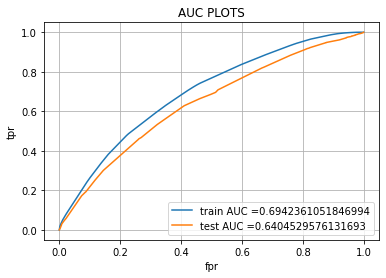

In [ ]:
from sklearn.metrics import roc_curve, auc
dt = DecisionTreeClassifier(max_depth=10,min_samples_split=500)
dt.fit(X_tr, y_train)
y_train_proba = dt.predict_proba(X_tr)[:,1]
y_test_proba = dt.predict_proba(X_te)[:,1]

train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, y_train_proba)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, y_test_proba)
# plot train auc and test auc curve
plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
plt.legend()
plt.xlabel("fpr")
plt.ylabel("tpr")
plt.title("AUC PLOTS")
plt.grid()
plt.show()

In [ ]:
# create confusion matrix
from sklearn.metrics import confusion_matrix
best_t = find_best_threshold(tr_thresholds, train_fpr, train_tpr)
train_matrix = confusion_matrix(y_train, predict_with_best_t(y_train_proba, best_t))
test_matrix = confusion_matrix(y_test, predict_with_best_t(y_test_proba, best_t))

the maximum value of tpr*(1-fpr) 0.409761171421991 for threshold 0.862


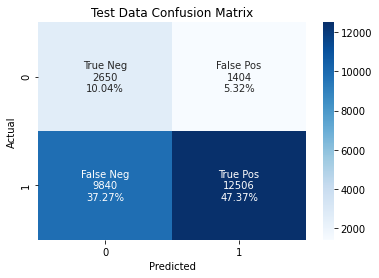

In [ ]:
group_names = ['True Neg','False Pos','False Neg','True Pos']
group_counts = ['{0:0.0f}'.format(value) for value in
                test_matrix.flatten()]
group_percentages = ['{0:.2%}'.format(value) for value in
                     test_matrix.flatten()/np.sum(test_matrix)]
labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]
labels = np.asarray(labels).reshape(2,2)
sns.heatmap(test_matrix, annot=labels, fmt='', cmap='Blues')
plt.title("Test Data Confusion Matrix")
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

In [ ]:
y_pred = predict_with_best_t(y_test_proba, best_t)
false_positives = X_test[(y_test == 0) & (y_pred == 1)]

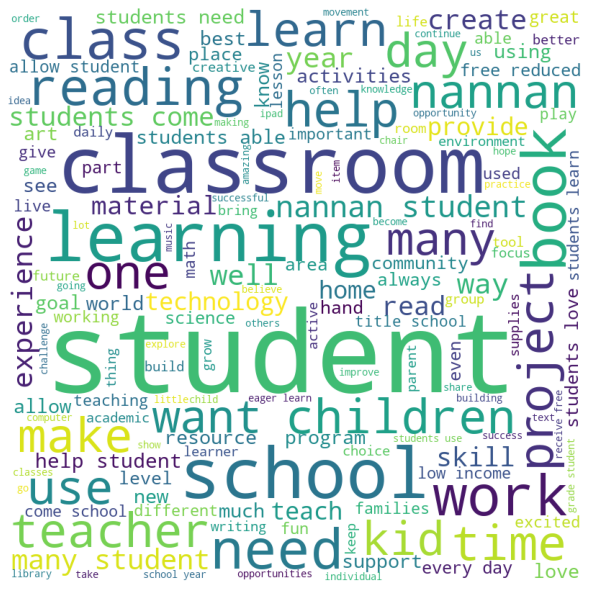

In [ ]:
from wordcloud import WordCloud, STOPWORDS 
import matplotlib.pyplot as plt 
import pandas as pd 
  
# Reads 'Youtube04-Eminem.csv' file  
essays = false_positives['essay'] 
  
comment_words = '' 
stopwords = set(STOPWORDS) 
  
# iterate through the csv file 
for val in essays: 
      
    # typecaste each val to string 
    val = str(val) 
  
    # split the value 
    tokens = val.split() 
      
    # Converts each token into lowercase 
    for i in range(len(tokens)): 
        tokens[i] = tokens[i].lower() 
      
    comment_words += " ".join(tokens)+" "
  
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                stopwords = stopwords, 
                min_font_size = 10).generate(comment_words) 
  
# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

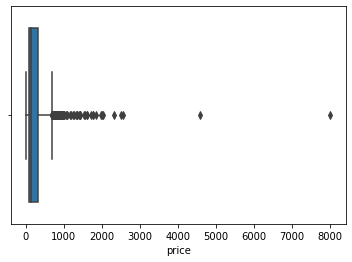

In [ ]:
sns.boxplot(false_positives['price'])

* same conclusion as previous model for price

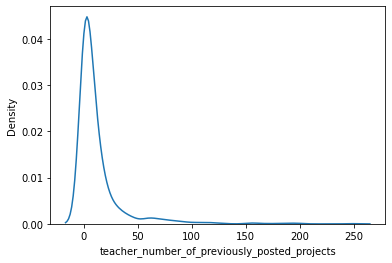

In [ ]:
sns.kdeplot(false_positives['teacher_number_of_previously_posted_projects'])

* same conclusion as previous model for projects previously submitted by teacher

In [ ]:
summary.add_row(["TFIDF_imp_features","Decision Tree",10, 500, 0.6404])

In [ ]:
#printing the summary
print(summary)

+--------------------+---------------+-----------+-------------------+--------+
|     Vectorizer     |     Model     | max_depth | min_samples_split |  AUC   |
+--------------------+---------------+-----------+-------------------+--------+
|       TFIDF        | Decision Tree |     10    |        500        | 0.6205 |
|     TFIDF_W2V      | Decision Tree |     5     |         5         | 0.625  |
| TFIDF_imp_features | Decision Tree |     10    |        500        | 0.6404 |
+--------------------+---------------+-----------+-------------------+--------+
